This script takes the dfs (for all relative abundance thresholds of 0%, 0.001%, 0.01%, 0.1%, and 1%) from refraction it into part(split).
- The split method divides the FASTQ files into ten subsamples and calculates the distance (jaccard and brey-curtis) for each depths.

In [3]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib.cm import ScalarMappable 
from matplotlib.lines import Line2D 
import matplotlib.patches as mpatches 
from matplotlib.patches import Patch
import matplotlib.lines as mlines
from textwrap import wrap 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes 
from scipy.stats import linregress
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [4]:
path_mp4_files = os.path.expanduser("/data1/Oded.Sabah/metaanalysis/Rarefaction_out/")
csv_files = glob.glob(os.path.join(path_mp4_files, '**', '*.csv'), recursive=True)

df_dict_thresh = {}
df_dict_split = {}

for file in csv_files:
    id_file = file.split("/")[-2]
    thresh_file = file.split("_")[-1].rstrip('.csv')
    process_type = file.split("_")[-2]

    # Read csv file into dataframe
    df = pd.read_csv(file)  

    # Add id_file as a column in the dataframe
    df['id_file'] = id_file
    df['thresh_file'] = thresh_file
    df["process_type"] = process_type

    # Change the index for dataframes where process_type == 'trash'
    if process_type == 'thresh' and "index" in df.columns:
        df["index"] = [index.split(".")[-1] for index in df["index"]]
    # Set id_file as the index of the dataframe
    df.set_index('id_file', inplace=True)

    # Create a key for the dictionary
    key_thresh = (id_file, thresh_file, process_type)

    # If key exists, append the data. Otherwise, store this df in dictionary.
    if key_thresh in df_dict_thresh:
        df_dict_thresh[key_thresh] = pd.concat([df_dict_thresh[key_thresh], df], ignore_index=True)
    else:
        df_dict_thresh[key_thresh] = df

    # Change the index for dataframes where process_type == 'trash'
    if process_type == 'split' and "index" in df.columns:
        df['group'] = df['index'].str.split('-').str[2]
        group = df['group'].iloc[0]

    key_split = (id_file, thresh_file, process_type)

    if key_split in df_dict_split:
        df_dict_split[key_split] = pd.concat([df_dict_split[key_split], df], ignore_index=True)
    else:
        df_dict_split[key_split] = df
        

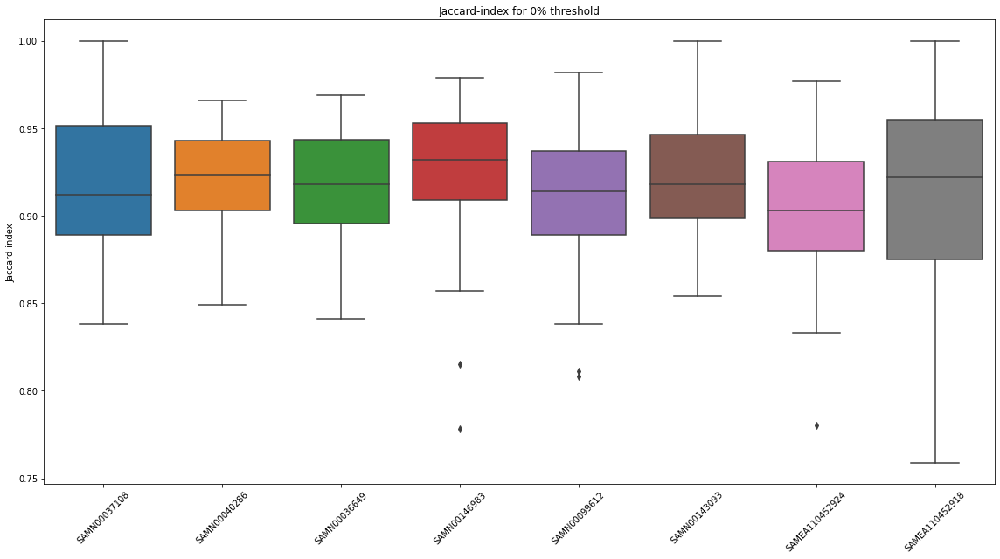

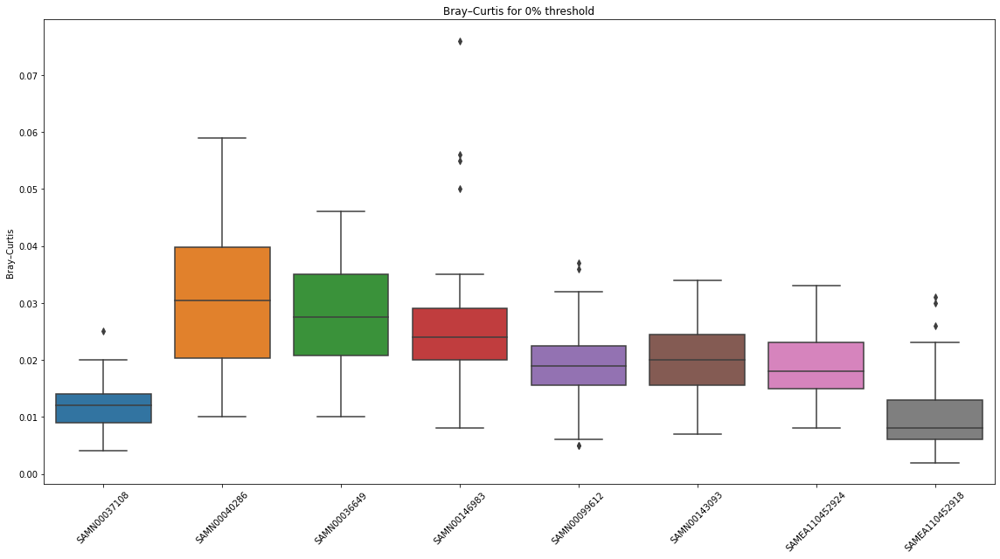

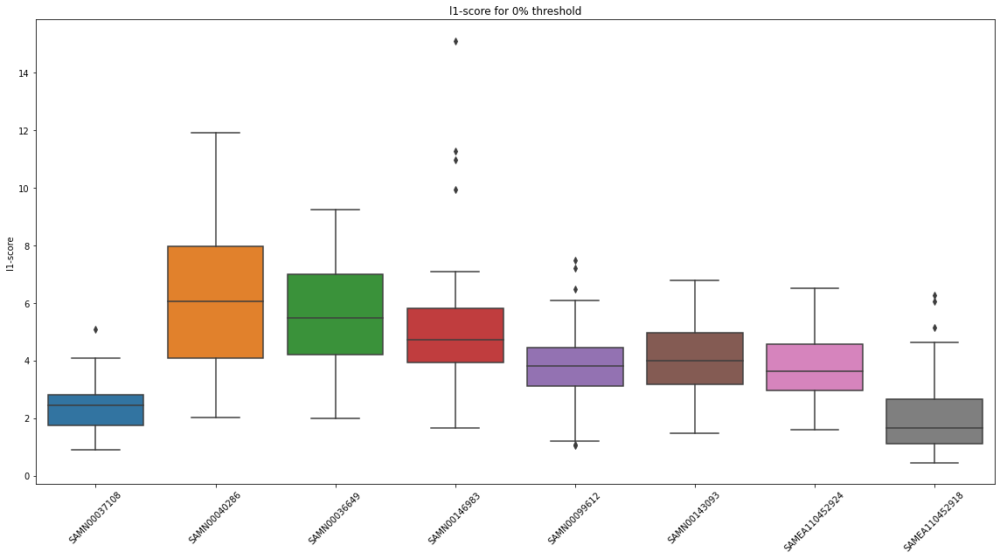

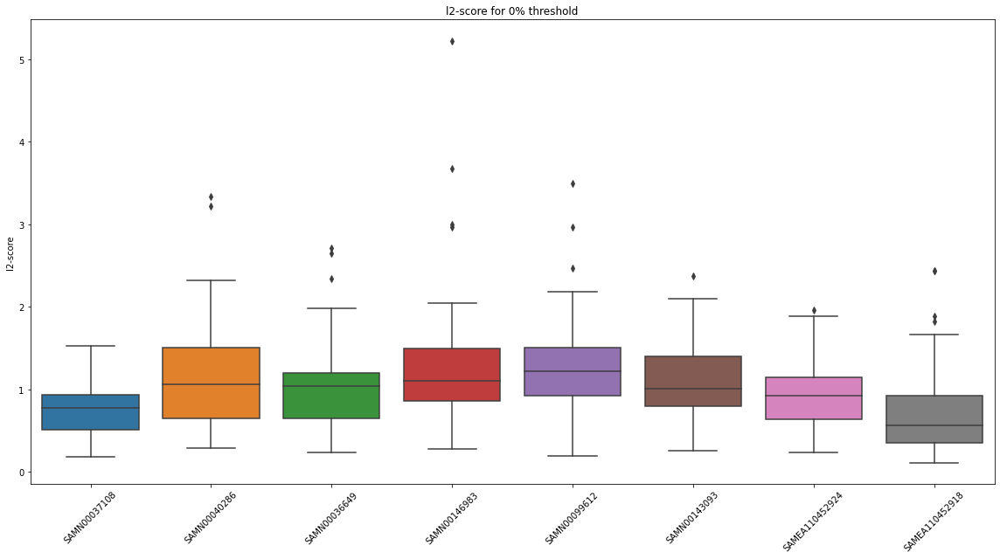

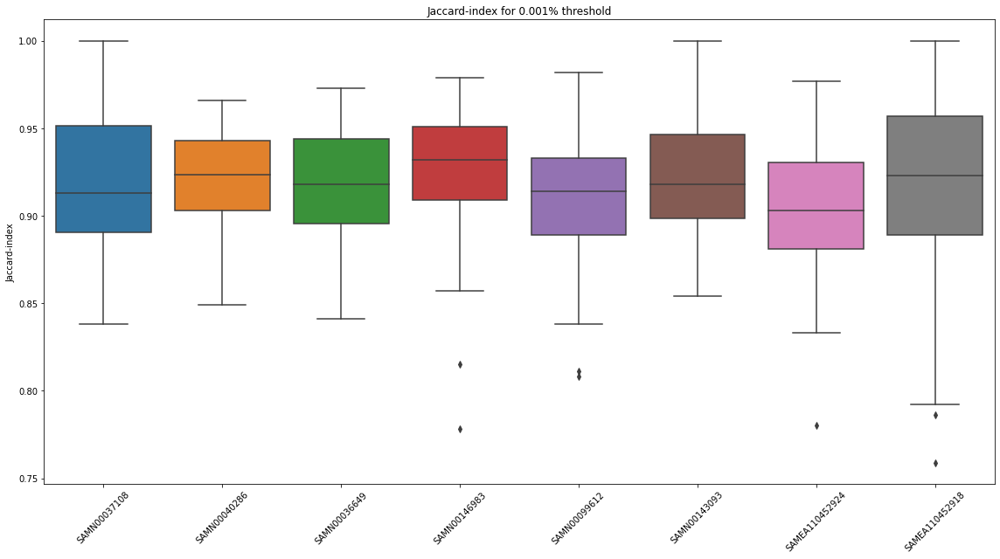

...

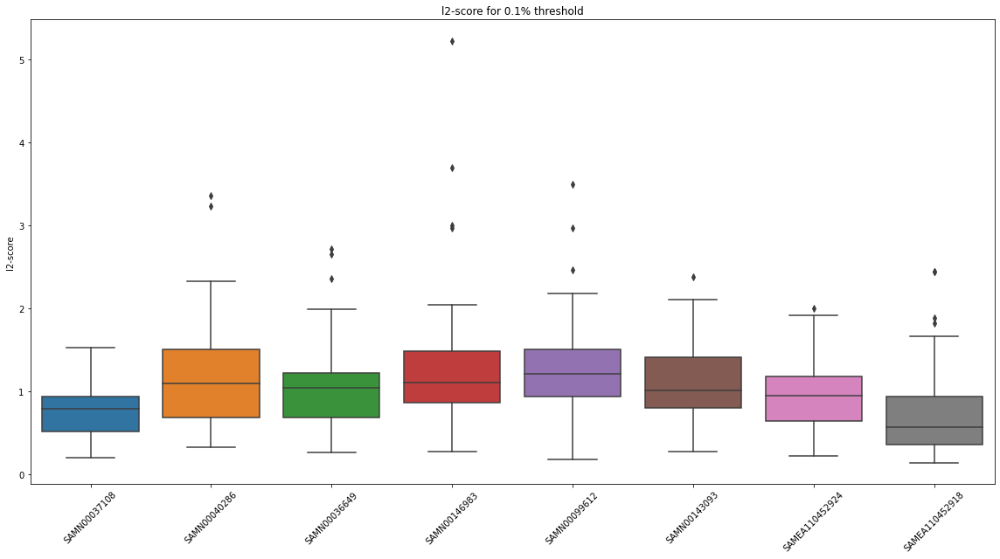

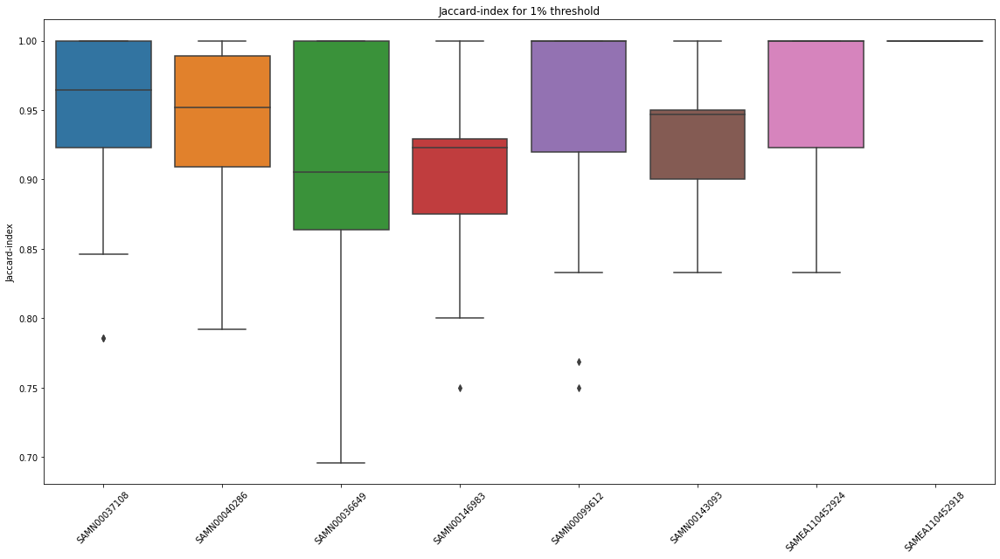

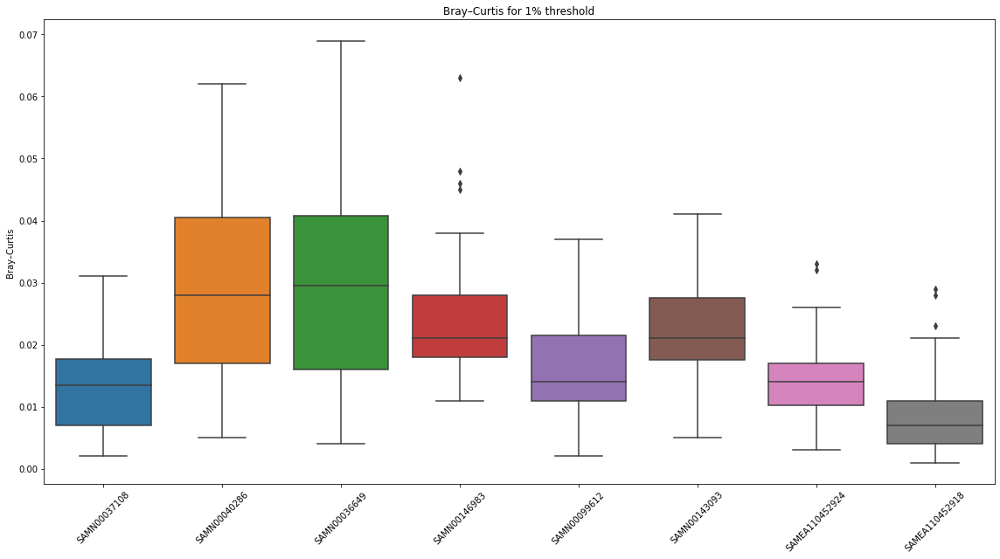

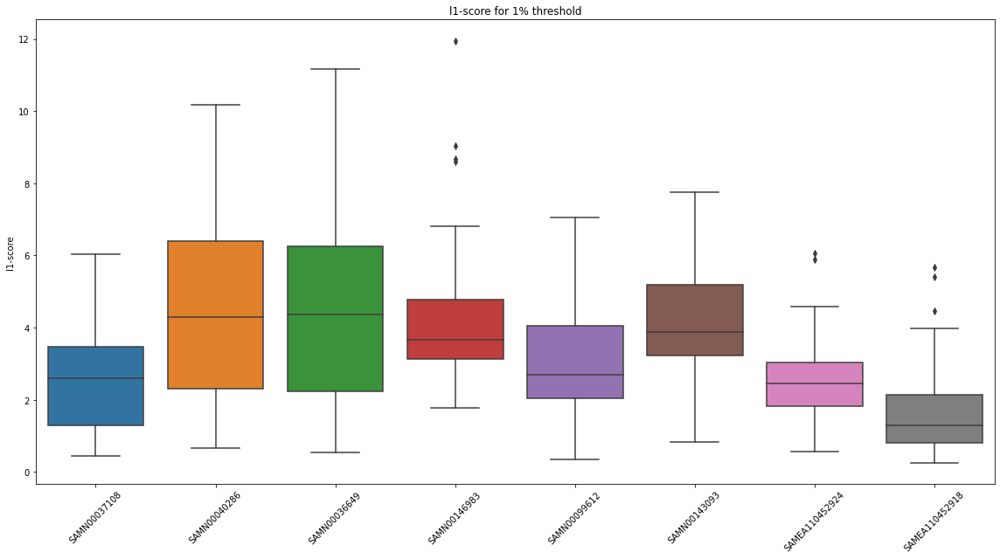

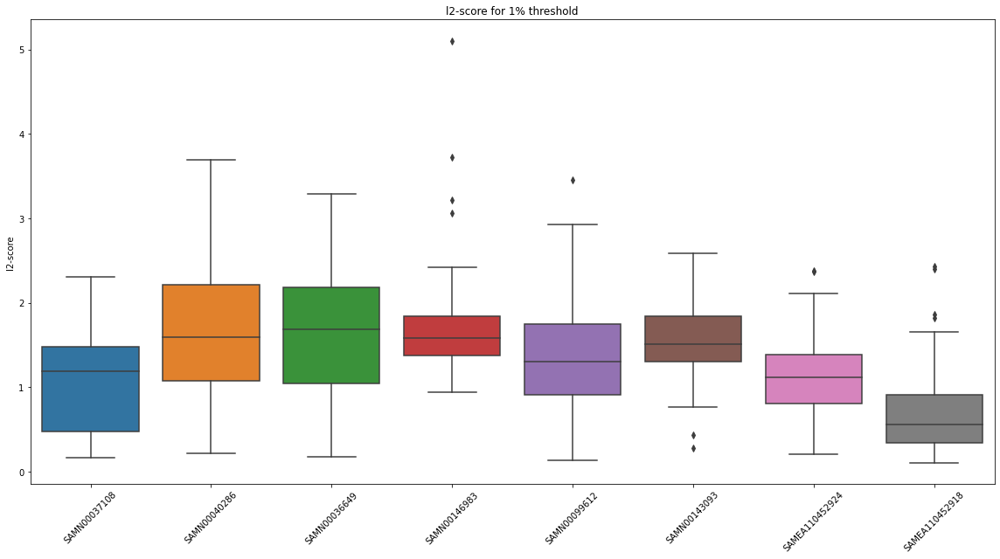

In [3]:
thresholds = [0, 0.001, 0.01, 0.1, 1]
columns = ['jaccard_scores', 'Dissimilarity', 'l1_score', 'l2_score']
ylabel = ['Jaccard-index', 'Bray–Curtis', 'l1-score', 'l2-score']

# Loop over each threshold
for threshold in thresholds:
    # Loop over each column
    for i, column in enumerate(columns):
        # Initialize figure and axes for each plot
        fig, ax = plt.subplots(figsize=(16,9))

        # List to store data for boxplot and corresponding labels
        data_to_plot = []
        labels = []

        # Loop over each key, dataframe in df_dict_split dictionary
        for key, df_split in df_dict_thresh.items():
            if (df_split["process_type"] == 'split').any() and (df_split["thresh_file"] == str(threshold)).any():
                # Add df[column] data and corresponding label to the lists
                data_to_plot.append(df_split[column].values)
                labels.append(', '.join(map(str, list(set(df_split.index)))))

        # Plot boxplot for data_to_plot
        sns.boxplot(data=data_to_plot, ax=ax)

        # Set plot title, x-axis and y-axis labels
        ax.set_xticklabels(labels, rotation=45)
        ax.set_title(f'{ylabel[i]} for {threshold}% threshold')
        ax.set_xlabel('')
        ax.set_ylabel(ylabel[i])

        # Display the plot
        plt.tight_layout()
        plt.show()

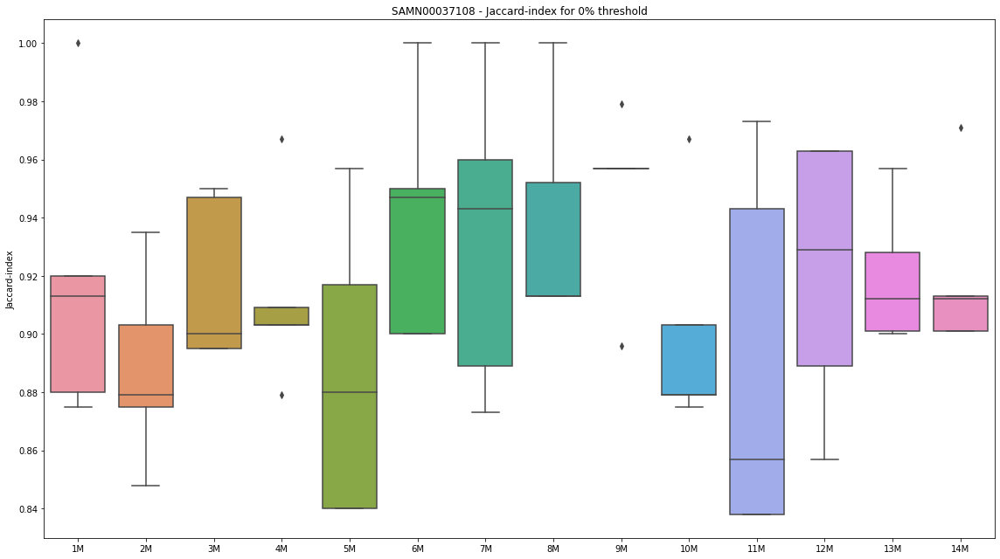

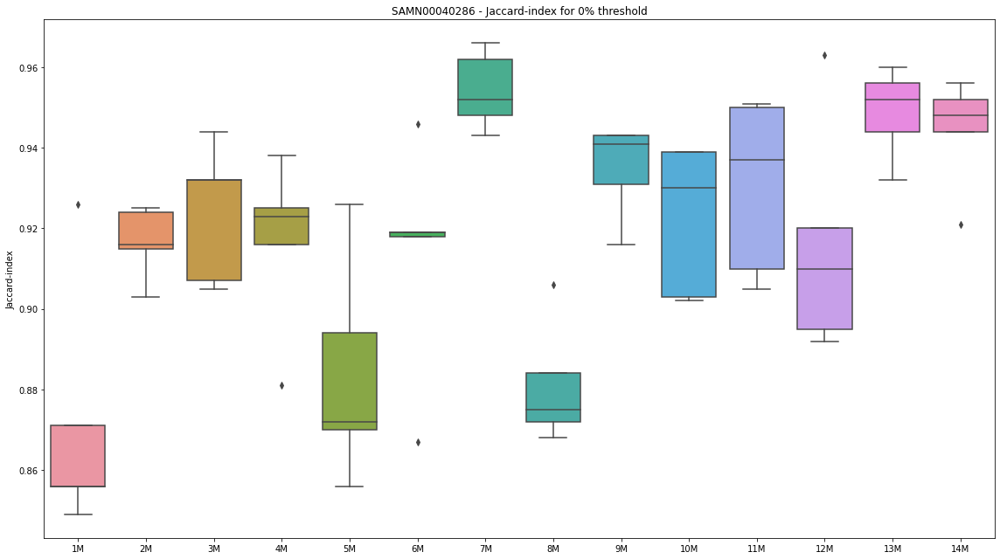

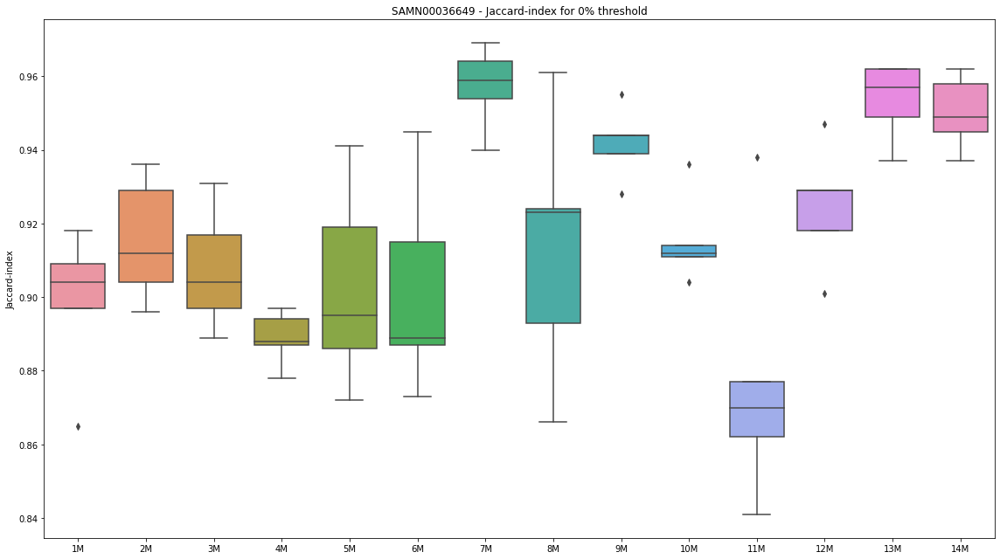

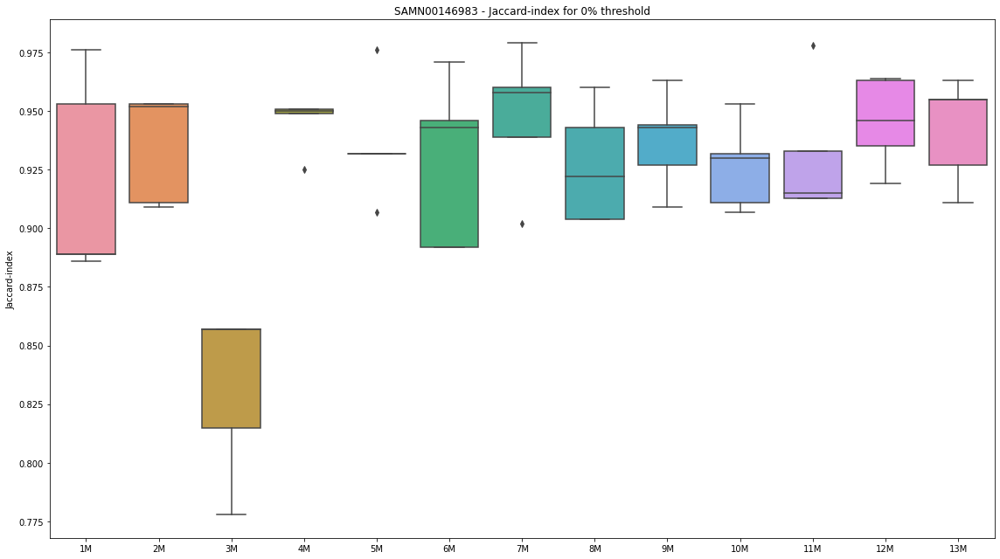

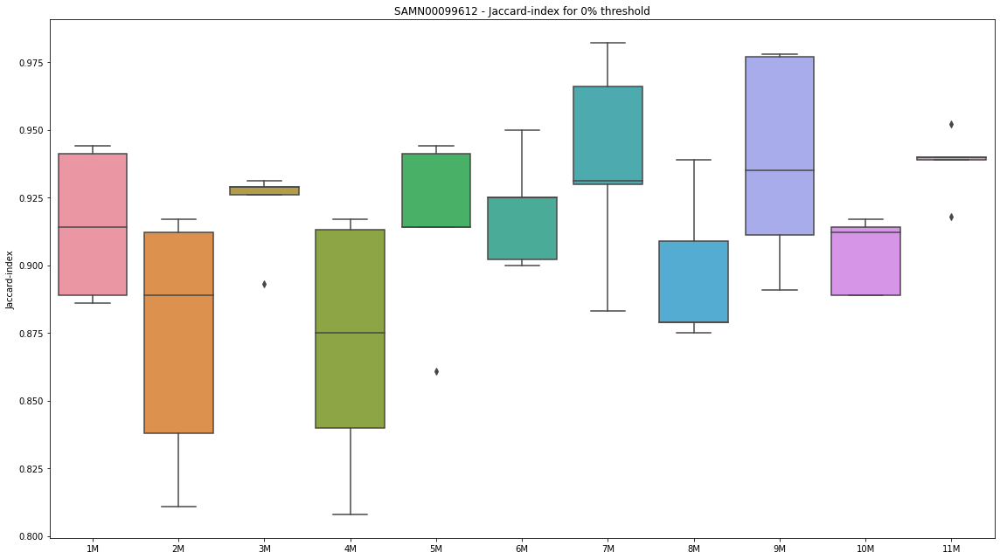

...

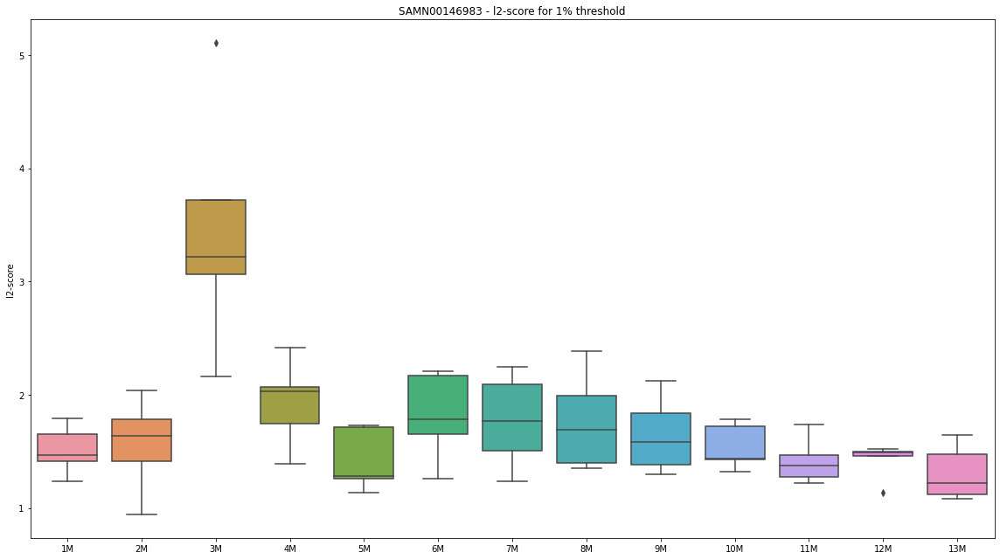

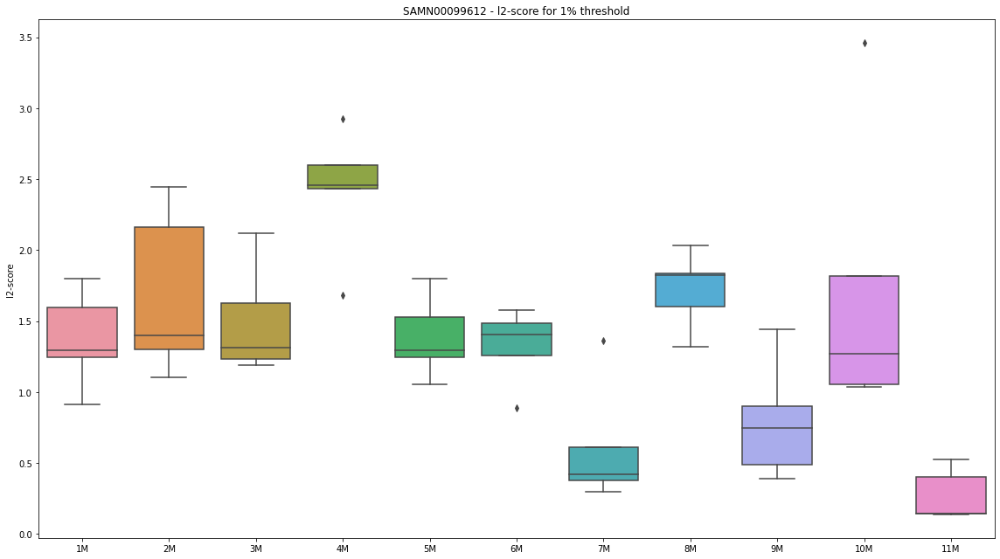

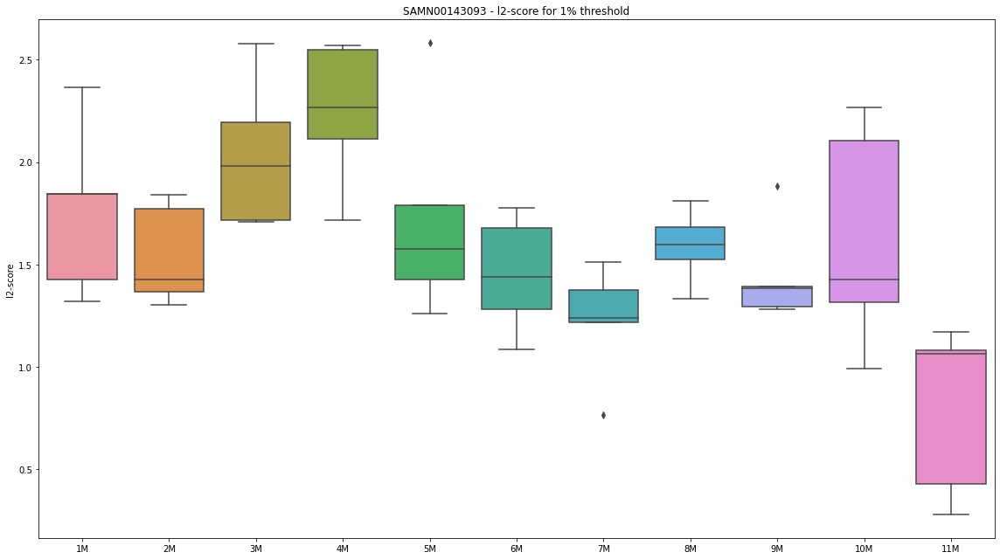

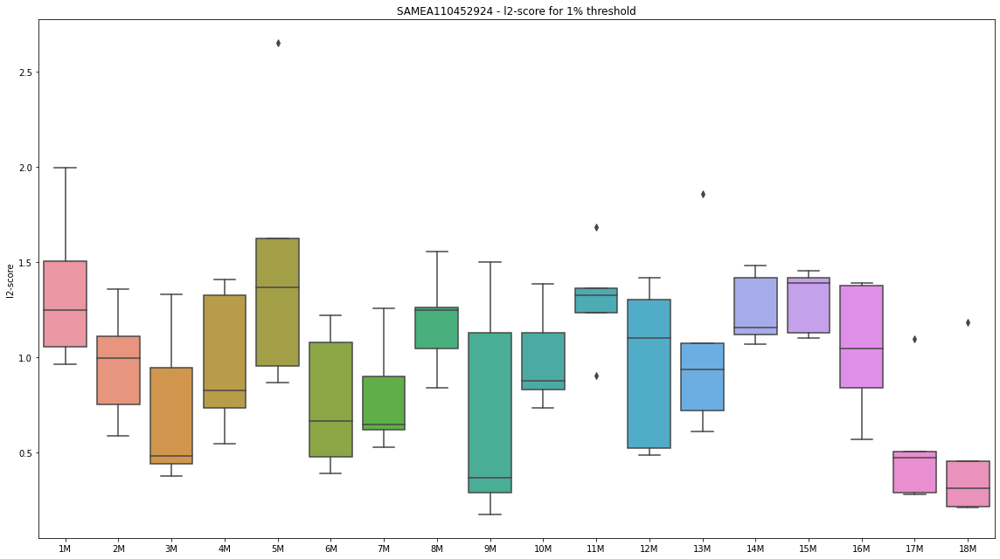

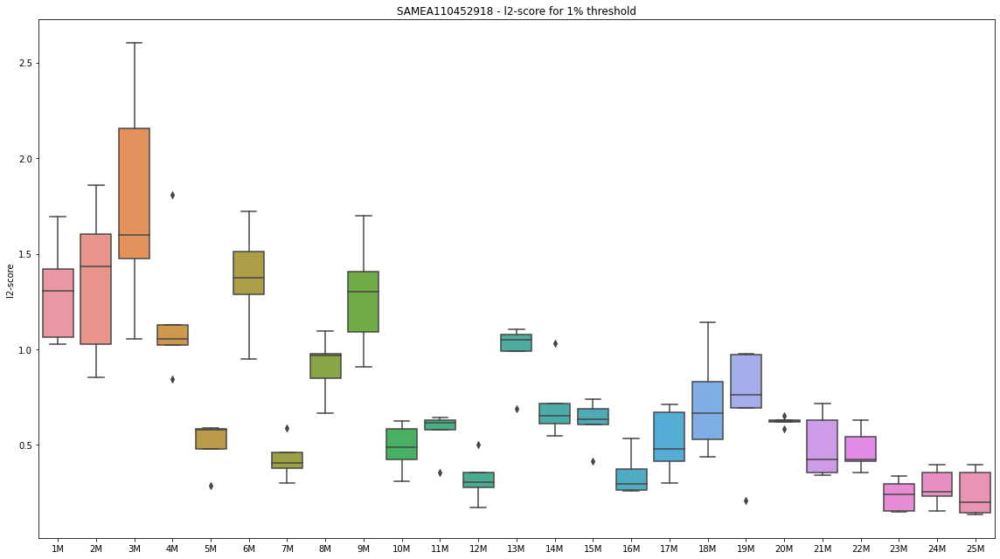

In [34]:
thresholds = [0, 0.001, 0.01, 0.1, 1]
columns = ['jaccard_scores', 'Dissimilarity', 'l1_score', 'l2_score']
ylabel = ['Jaccard-index', 'Bray–Curtis', 'l1-score', 'l2-score']

# Loop over each threshold
for threshold in thresholds:
    # Loop over each column
    for i, column in enumerate(columns):
        # Loop over each key, dataframe in df_dict_thresh dictionary
        for key, df_split in df_dict_thresh.items():
            if (df_split["process_type"] == 'split').any() and (df_split["thresh_file"] == str(threshold)).any():
                
                # Get the name of id_file from the index
                if 'id_file' in df_split.index.names:
                    id_file_name = df_split.index.get_level_values('id_file')[0]
                else:
                    id_file_name = "Unknown ID File"
                
                # Convert the 'group' column to numeric by stripping the "M"
                df_split['numeric_index'] = df_split['group'].str.rstrip('M').astype(float)
                
                # Sort by 'numeric_index'
                df_split_sorted = df_split.sort_values(by='numeric_index').reset_index(drop=True)
                
                # Initialize figure and axes for each plot
                fig, ax = plt.subplots(figsize=(16,9))
                
                # Plot boxplot for df_split_sorted[column] with sorted 'group' column as x-axis
                sns.boxplot(x='group', y=column, data=df_split_sorted, ax=ax)
                
                # Set xticks with sorted labels
                sorted_labels = df_split_sorted['group'].unique()
                ax.set_xticks(range(len(sorted_labels)))  # Set xticks as range of sorted_labels length
                ax.set_xticklabels(sorted_labels, rotation=0)  # Set xtick labels as sorted 'group' values
                
                # Set plot title, x-axis and y-axis labels
                ax.set_title(f'{id_file_name} - {ylabel[i]} for {threshold}% threshold')
                ax.set_xlabel('')
                ax.set_ylabel(ylabel[i])

                # Display the plot
                plt.tight_layout()
                plt.show()


In [16]:
filtered_data = []
for key, df in df_dict_thresh.items():
    if key[1] == '0' and key[2] == 'split':
        df['id_file'] = key[0]  # Adding the id_file
        #Convert the 'index' column to numeric by stripping the "M"
        df['numeric_index'] = df['group'].str.rstrip('M').astype(float)
        df = df.sort_values(by='numeric_index').reset_index(drop=True)
        filtered_data.append(df)


This section create df contion the summray all distances methods (jacced, bray-curtis, l1, l2) and the average the nubner of species each sequence depth  

In [6]:
# Assuming df_dict_split is a predefined dictionary of DataFrames
thresholds = ['0', '0.001', '0.01', '0.1', '1']

all_data_split = []

for thresh in thresholds:
    filtered_data = []

    for key, df in df_dict_split.items():
        if key[1] == thresh and key[2] == 'split':
            df['id_file'] = key[0]  # Adding the id_file

            # Calculate 'Species_mean' for this DataFrame
            df['Species_mean'] = df.groupby('thresh_file')['m_species'].transform(
                lambda x: (x / x.max()) * 100
            )

            filtered_data.append(df)

    if filtered_data:
        df_split = pd.concat(filtered_data, ignore_index=True)
        all_data_split.append(df_split)
        df_split.drop(['process_type', 'index'], axis=1, inplace=True)
        df_split['threshold'] = thresh
    else:
        print(f"No data for threshold {thresh}")
    
# Concatenate all DataFrames for splits
final_df_split = pd.concat(all_data_split, ignore_index=True)
# Create a depth column and retain the original group column
final_df_split['depth'] = final_df_split['group'].str.rstrip('M').astype(float) * 1e6

# Select only numeric columns for mean calculation
numeric_cols = final_df_split.select_dtypes(include='number').columns.tolist()

# Group by ['threshold', 'depth'] and calculate the mean for numeric columns only
grouped = final_df_split.groupby(['threshold', 'depth'], as_index=False)[numeric_cols].mean()

# Reattach the 'group' column to the DataFrame
final_df_split = grouped.merge(final_df_split[['threshold', 'depth', 'group']].drop_duplicates(), 
                               on=['threshold', 'depth'], how='left')

df2rf = final_df_split.copy()
display(df2rf.tail(60))

,threshold,jaccard_scores,m_species,Dissimilarity,l1_score,l2_score,Species_mean,depth,group
65,0.01,0.926500,37.800000,0.013100,2.652800,0.684000,57.966979,16000000.0,16M
66,0.01,0.916300,67.850000,0.007700,1.532300,0.395800,78.778756,17000000.0,17M
67,0.01,0.938700,66.500000,0.010000,1.983300,0.574500,75.361035,18000000.0,18M
68,0.01,0.918200,21.100000,0.009200,1.859800,0.627200,53.417722,19000000.0,19M
69,0.01,0.889800,25.100000,0.006800,1.347800,0.479800,63.544304,20000000.0,20M
70,0.01,0.965000,21.800000,0.009200,1.863800,0.624400,55.189873,21000000.0,21M
71,0.01,0.982000,21.800000,0.008600,1.717200,0.582400,55.189873,22000000.0,22M
72,0.01,0.950200,39.000000,0.004000,0.774400,0.297200,98.734177,23000000.0,23M
73,0.01,0.940400,39.000000,0.003600,0.745000,0.264400,98.734177,24000000.0,24M
74,0.01,0.940400,39.000000,0.003400,0.734400,0.255800,98.734177,25000000.0,25M


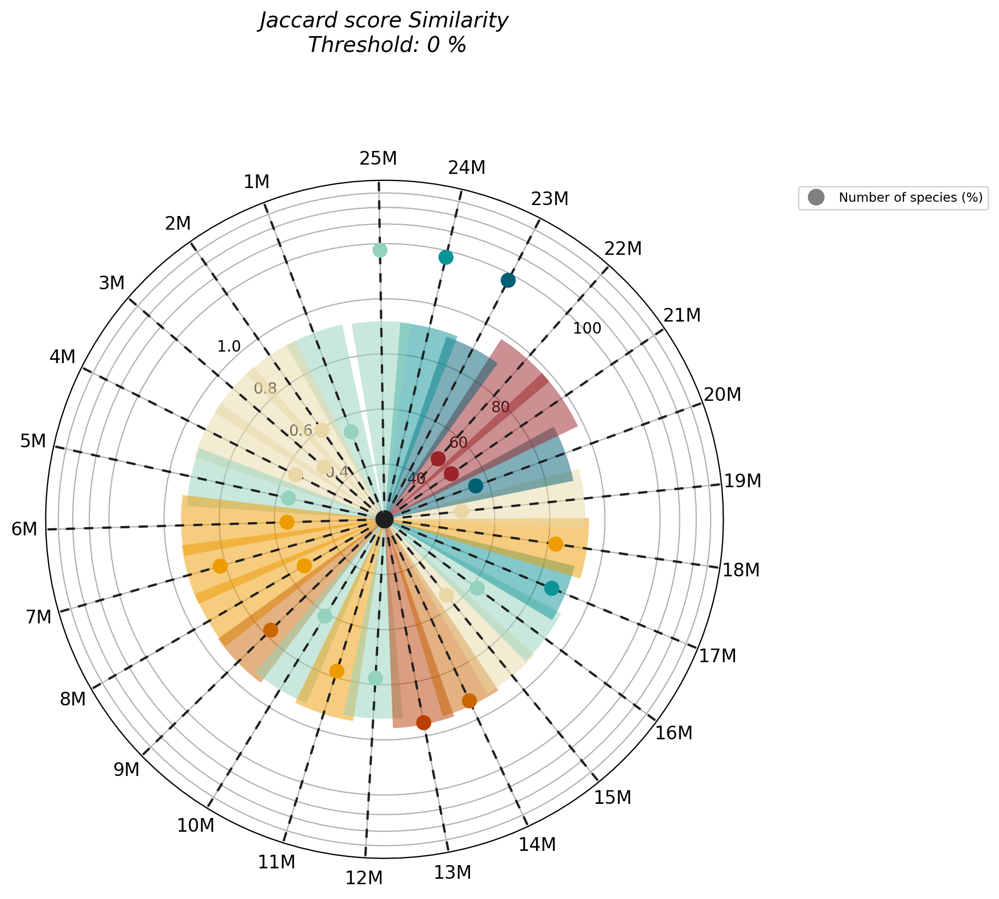

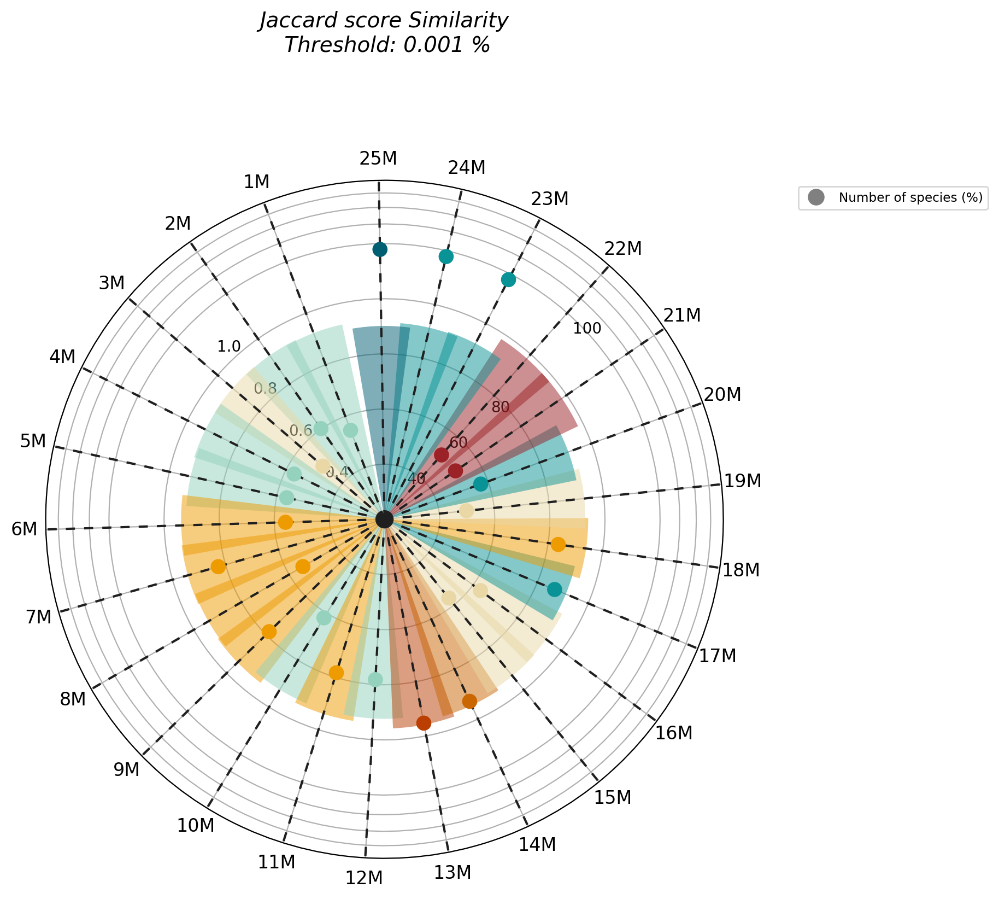

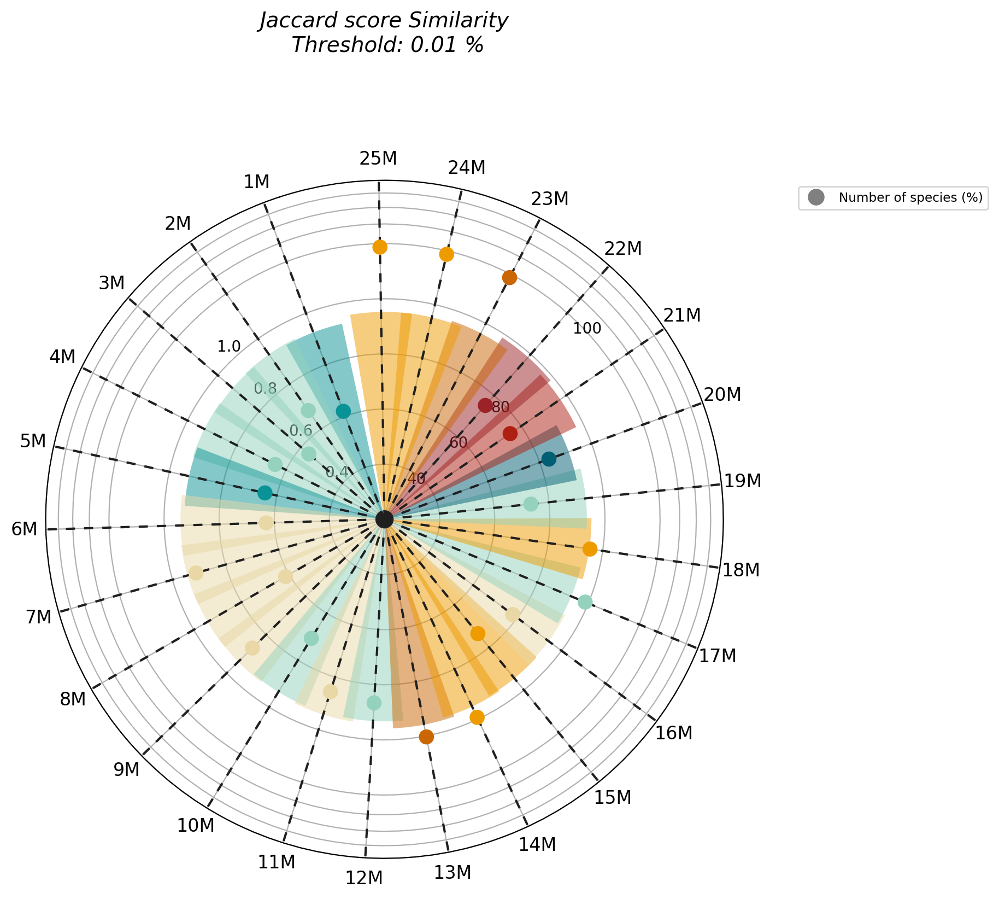

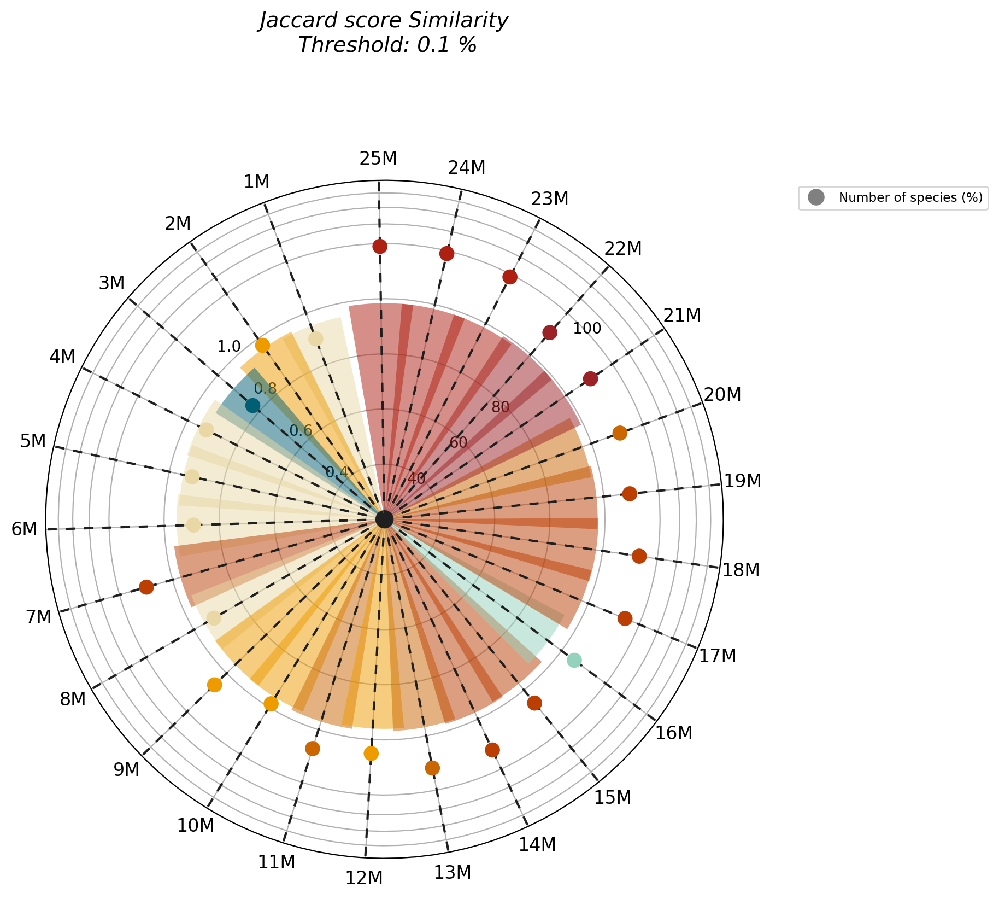

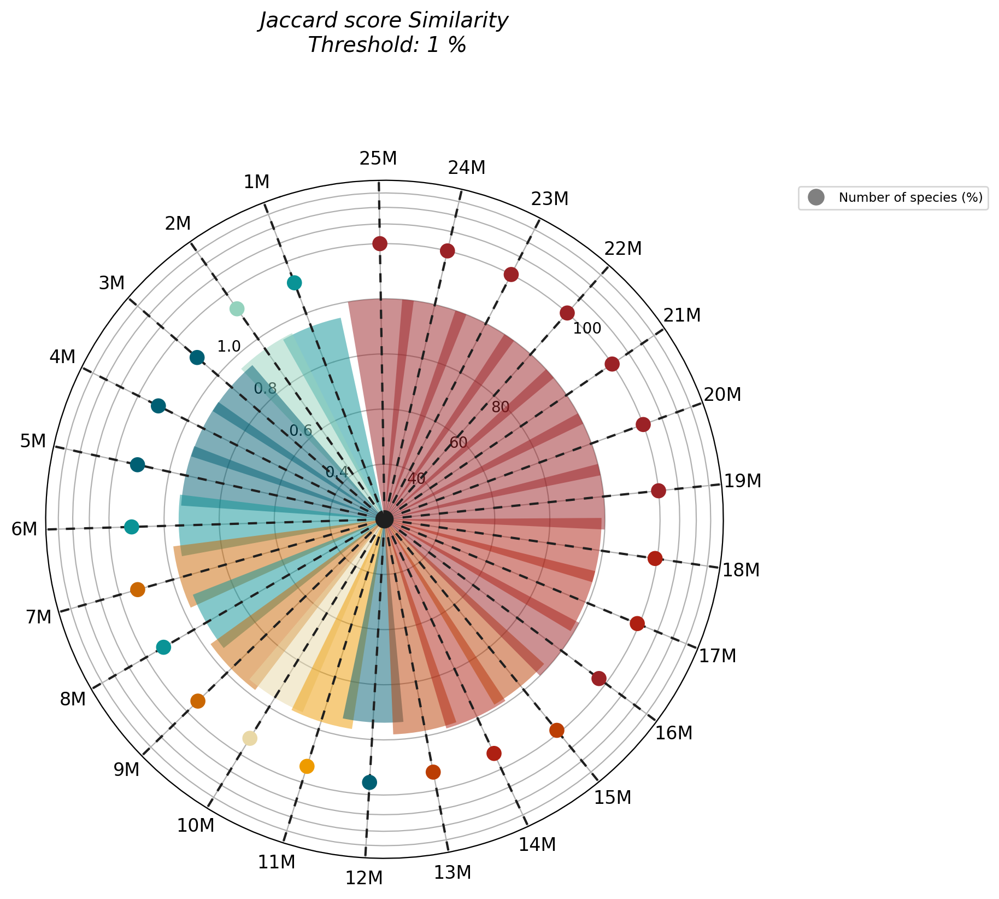

In [15]:
# Assuming final_df_split is your final DataFrame with necessary columns
thresholds = ['0', '0.001', '0.01', '0.1', '1']
COLORS =  ["#005f73", "#0a9396", "#94d2bd", "#e9d8a6", "#ee9b00", "#ca6702", "#bb3e03", "#ae2012", "#9b2226"]


# Define colors for the colormap
cmap = mpl.colors.LinearSegmentedColormap.from_list("my color", COLORS, N=9)

for thresh in thresholds:
    df = final_df_split[final_df_split['threshold'] == thresh]

    # Normalizer for colors
    NUMBERS = df['jaccard_scores'].values
    norm = mpl.colors.Normalize(vmin=NUMBERS.min(), vmax=NUMBERS.max())
    COLORS = cmap(norm(NUMBERS))

    # Initialize layout in polar coordinates
    fig, ax = plt.subplots(figsize=(8, 16), subplot_kw={"projection": "polar"}, dpi=200)

    # Set background color to white
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")

    ax.set_theta_offset(1.2 * np.pi / 2)
    min_ground_truth = df['jaccard_scores'].min()
    max_ground_truth = df['Species_mean'].max()
    ax.set_ylim(min_ground_truth, max_ground_truth)
    ax.set_yscale('symlog', linthresh=100)

    # Set the y-ticks and customize the labels
    y_ticks = np.linspace(min_ground_truth, max_ground_truth, 11)
    ax.set_rticks(y_ticks)
    ax.set_yticklabels(np.around(np.linspace(0, 1, len(y_ticks)), 1))
    ax.set_rlabel_position(22)
    ax.set_yticklabels([])

    # Add bars for 'jaccard_scores'
    ANGLES = np.linspace(0.05, 2 * np.pi - 0.05, len(df), endpoint=False)
    LENGTHS = df['jaccard_scores'].values * 80
    ax.bar(ANGLES, LENGTHS, color=COLORS, alpha=0.5, width=0.3, zorder=11, label='Jaccard-index similarity score')

    # Add dashed vertical lines
    ax.vlines(ANGLES, 0, 200, color="#1f1f1f", ls=(0, (4, 4)), zorder=11)

    # Add dots for 'Species_mean'
    MEAN_GAIN = df['Species_mean'].values
    ax.scatter(ANGLES, MEAN_GAIN, s=80, color=COLORS, zorder=11, label='Species counts')

    # Add labels for the regions
    REGION = ["\n".join(wrap(r, 5, break_long_words=False)) for r in df['group'].values]
    ax.set_xticks(ANGLES)
    ax.set_xticklabels(REGION, size=12)
    ax.set_yticks(np.arange(0, 200, step=20))
    
    # Add scale starting at 1M and ending at 45M
    PAD = 10
    ax.text(-0.75 * np.pi / 2, 10 + PAD, "40", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 30 + PAD, "60", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 50 + PAD, "80", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 100 + PAD, "100", ha="right", size=10)

    ax.text(0.25 * np.pi / 2, 10 + PAD, "0.4", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 30 + PAD, "0.6", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 50 + PAD, "0.8", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 70 + PAD, "1.0", ha="right", size=10)
    
    # Add custom legend
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Number of species (%)', markerfacecolor='gray', markersize=12)]
    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.4, 1), fontsize='small')
    
    # Add title and subtile at the top of the chart
    plt.title(f'Jaccard score Similarity\n Threshold: {thresh} %',
              style = 'italic', size = 14, pad = 85)

    # Display the chart
    plt.show()


Snail graph for bray-curtis type tresh 

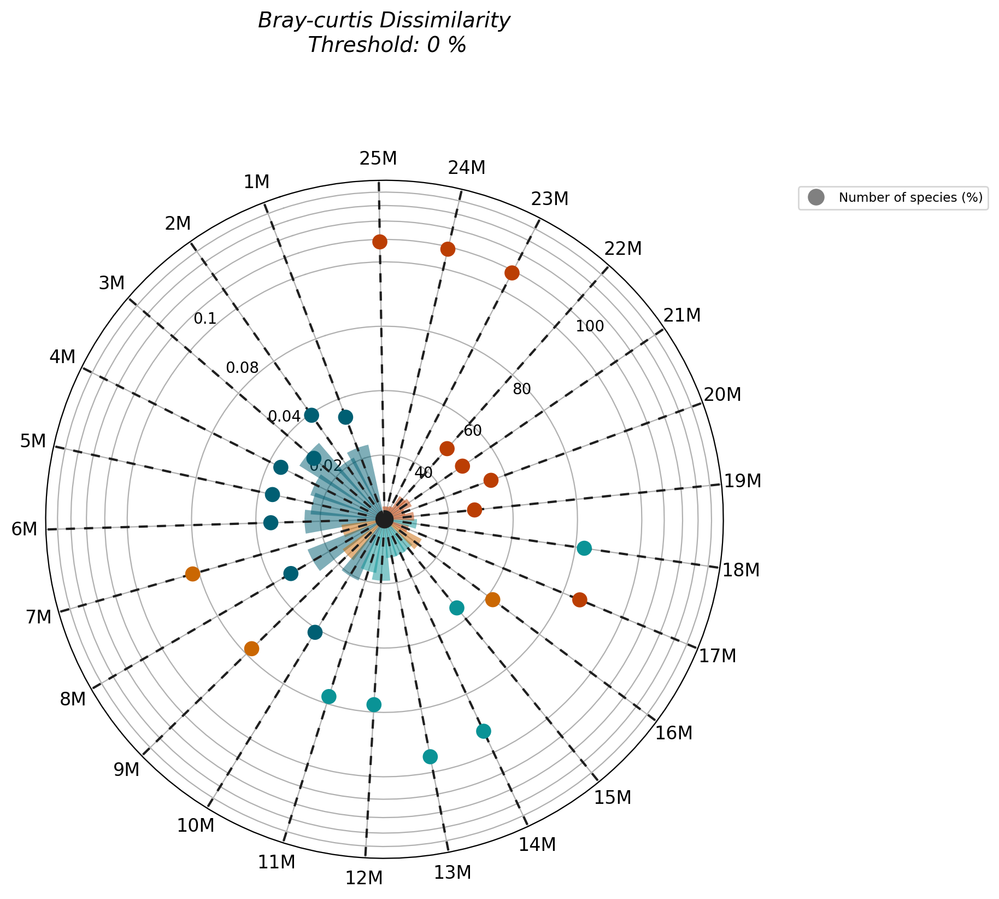

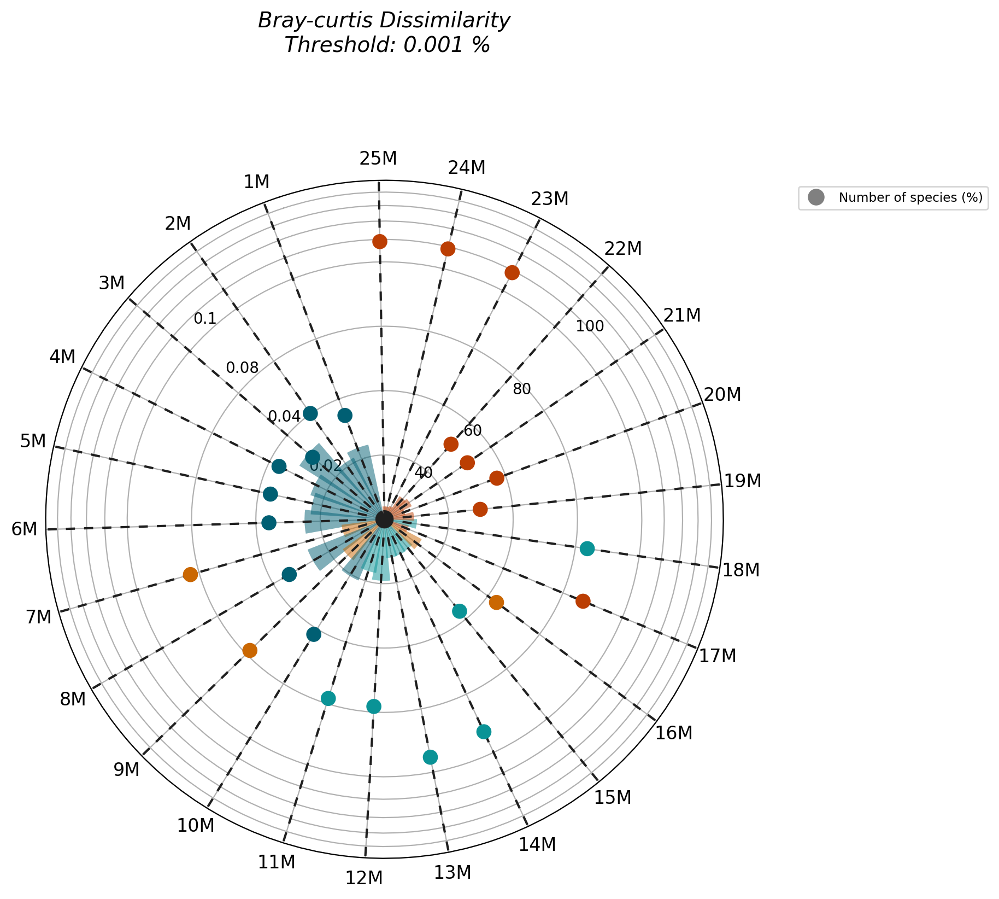

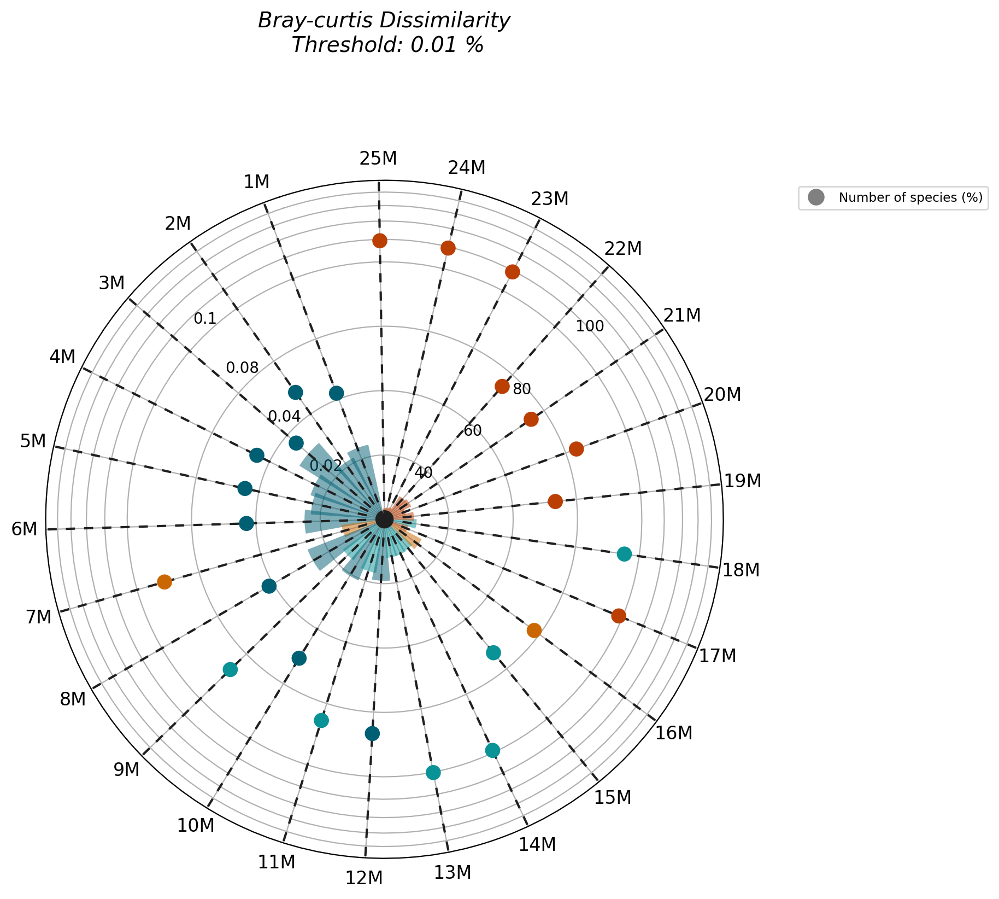

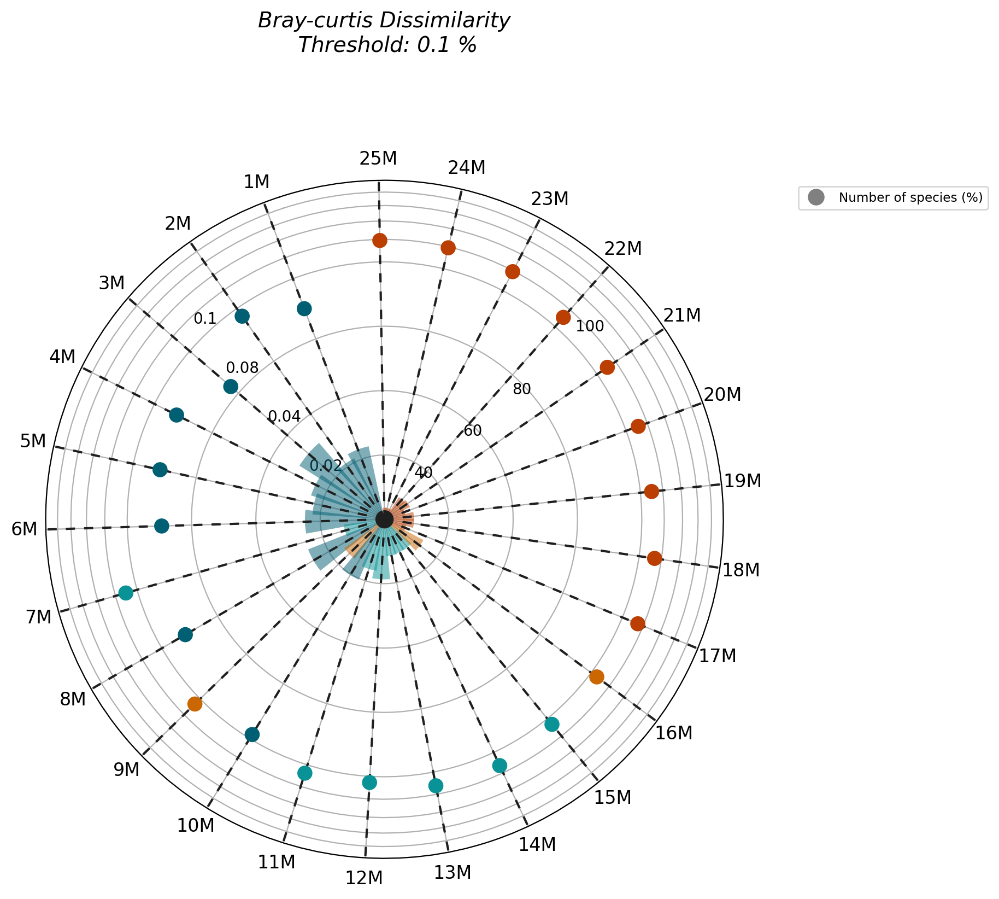

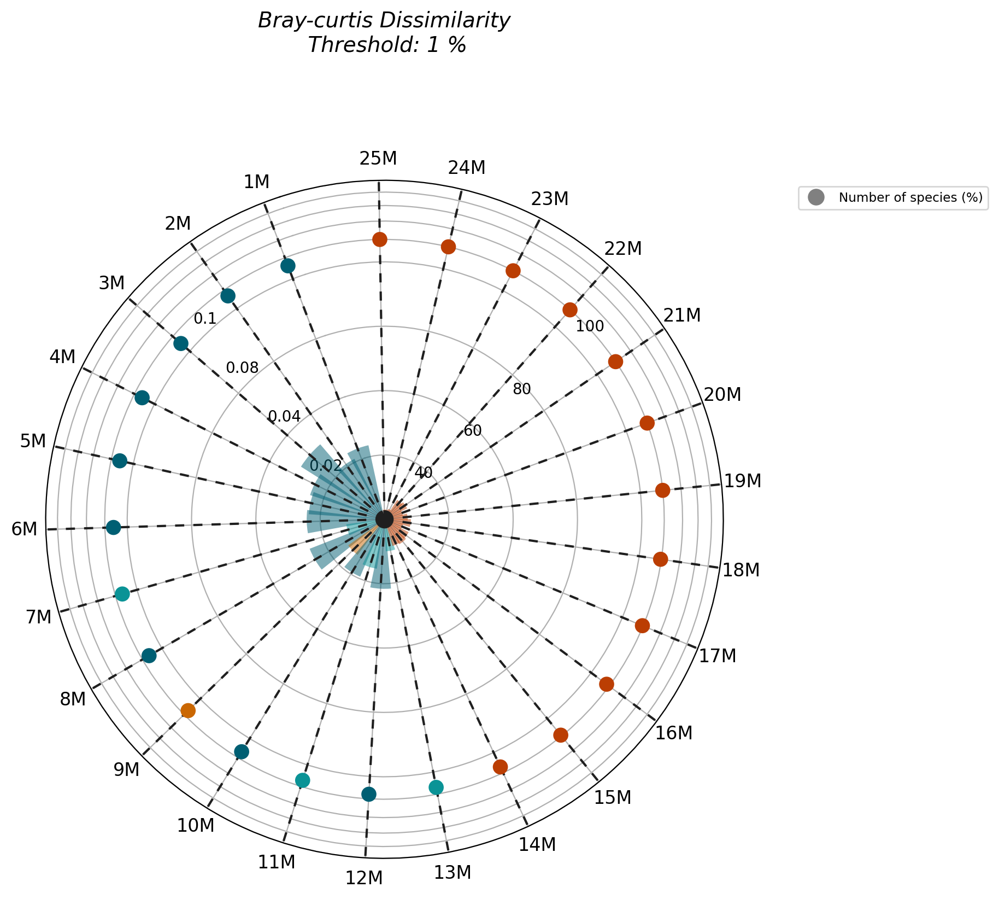

In [11]:
# Define colors for the colormap
COLORS = ["#005f73", "#0a9396", "#94d2bd", "#e9d8a6", "#ee9b00", "#ca6702", "#bb3e03", "#ae2012", "#9b2226"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("my color", COLORS, N=9)

for thresh in thresholds:
    df = final_df_split[final_df_split['threshold'] == thresh]

    # Normalizer for colors
    NUMBERS = df['Dissimilarity'].values
    norm = mpl.colors.Normalize(vmin=NUMBERS.min(), vmax=NUMBERS.max())
    COLORS = cmap(norm(NUMBERS))

    # Initialize layout in polar coordinates
    fig, ax = plt.subplots(figsize=(8, 16), subplot_kw={"projection": "polar"}, dpi=200)

    # Set background color to white
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")

    ax.set_theta_offset(1.2 * np.pi / 2)
    min_ground_truth = df['Dissimilarity'].min()
    max_ground_truth = df['Species_mean'].max()
    ax.set_ylim(min_ground_truth, max_ground_truth)
    ax.set_yscale('symlog', linthresh=80)

    # Set the y-ticks and customize the labels
    y_ticks = np.linspace(min_ground_truth, max_ground_truth, 11)
    ax.set_rticks(y_ticks)
    ax.set_yticklabels(np.around(np.linspace(0, 1, len(y_ticks)), 1))
    ax.set_rlabel_position(50)

    ax.set_yticklabels([])

    # Add bars for 'jaccard_scores'
    ANGLES = np.linspace(0.05, 2 * np.pi - 0.05, len(df), endpoint=False)
    LENGTHS = df['Dissimilarity'].values * 1000
    ax.bar(ANGLES, LENGTHS, color=COLORS, alpha=0.5, width=0.3, zorder=11, label='bray-curtis Dissimilarity score')

    # Add dashed vertical lines
    ax.vlines(ANGLES, 0, 200, color="#1f1f1f", ls=(0, (4, 4)), zorder=11)

    # Add dots for 'Species_mean'
    MEAN_GAIN = df['Species_mean'].values
    ax.scatter(ANGLES, MEAN_GAIN, s=80, color=COLORS, zorder=11, label='Species counts')

    # Add labels for the regions
    REGION = ["\n".join(wrap(r, 5, break_long_words=False)) for r in df['group'].values]
    ax.set_xticks(ANGLES)
    ax.set_xticklabels(REGION, size=12)
    ax.set_yticks(np.arange(0, 200, step=20))
    
    # Add scale starting at 1M and ending at 45M
    PAD = 10
    ax.text(-0.75 * np.pi / 2, 10 + PAD, "40", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 30 + PAD, "60", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 50 + PAD, "80", ha="right", size=10)
    ax.text(-0.75 * np.pi / 2, 100 + PAD, "100", ha="right", size=10)

    ax.text(0.25 * np.pi / 2, 10 + PAD, "0.02", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 30 + PAD, "0.04", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 50 + PAD, "0.08", ha="right", size=10)
    ax.text(0.25 * np.pi / 2, 70 + PAD, "0.1", ha="right", size=10)

    # Add custom legend
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Number of species (%)', markerfacecolor='gray', markersize=12)]
    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.4, 1), fontsize='small')
    # Add title and subtile at the top of the chart
    plt.title(f'Bray-curtis Dissimilarity\n Threshold: {thresh} %',
              style = 'italic', size = 14, pad = 85)

    # Display the chart
    plt.show()
